<a href="https://colab.research.google.com/github/laussin86/E-commerce-data-analysis/blob/main/E_commerce_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
import numpy as np
import pandas as pd
import sqlite3
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [25]:
time = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/time_dim.csv")
fact = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/fact_table.csv")
trans = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/Trans_dim.csv")
item = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/item_dim.csv", encoding="ISO-8859-1")
store = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/store_dim.csv")
customer = pd.read_csv("/content/drive/MyDrive/BCG/Ecommerce/customer_dim.csv", encoding="ISO-8859-1")

In [26]:
conn = sqlite3.connect(":memory:")

In [27]:
time.to_sql("time_table", conn, index=False)
fact.to_sql("fact_table", conn, index=False)
trans.to_sql("trans_table", conn, index=False)
item.to_sql("item_table", conn, index=False)
store.to_sql("store_table", conn, index=False)
customer.to_sql("customer_table", conn, index=False)

9191

**Let's retrieve some information from those table**

In [6]:
query = """
SELECT name
FROM sqlite_master
WHERE type="table";
"""
table_names = pd.read_sql_query(query, conn)
table_names

,name
0,time_table
1,fact_table
2,trans_table
3,item_table
4,store_table
5,customer_table


In [31]:
query = """
SELECT COUNT(*) AS num_rows, "time_table" AS table_name FROM time_table
UNION ALL
SELECT COUNT(*), "fact_table" FROM fact_table
UNION ALL
SELECT COUNT(*), "trans_table" FROM trans_table
UNION ALL
SELECT COUNT(*), "item_table" FROM item_table
UNION ALL
SELECT COUNT(*), "store_table" FROM store_table
UNION ALL
SELECT COUNT(*), "customer_table" FROM customer_table;
"""

tables = pd.read_sql_query(query, conn)
tables

,num_rows,table_name
0,99999,time_table
1,1000000,fact_table
2,39,trans_table
3,264,item_table
4,726,store_table
5,9191,customer_table


In [32]:
for name in table_names["name"]:
    query = """
    PRAGMA table_info("{}")
    """.format(name)
    table_info = pd.read_sql_query(query, conn)
    table_info["table_name"] = name
    tables = pd.concat([tables, table_info])

tables

,num_rows,table_name,cid,name,type,notnull,dflt_value,pk
0,99999.0,time_table,NaN,NaN,NaN,NaN,NaN,NaN
1,1000000.0,fact_table,NaN,NaN,NaN,NaN,NaN,NaN
2,39.0,trans_table,NaN,NaN,NaN,NaN,NaN,NaN
3,264.0,item_table,NaN,NaN,NaN,NaN,NaN,NaN
4,726.0,store_table,NaN,NaN,NaN,NaN,NaN,NaN
5,9191.0,customer_table,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,time_table,0.0,time_key,TEXT,0.0,NaN,0.0
1,NaN,time_table,1.0,date,TEXT,0.0,NaN,0.0
2,NaN,time_table,2.0,hour,INTEGER,0.0,NaN,0.0
3,NaN,time_table,3.0,day,INTEGER,0.0,NaN,0.0


#SALES ANALYSIS

**Lets see the preferred payment type, the distribution of the prices of the units andthe most frequent price for every transaction**

Text(0, 0.5, 'Num')

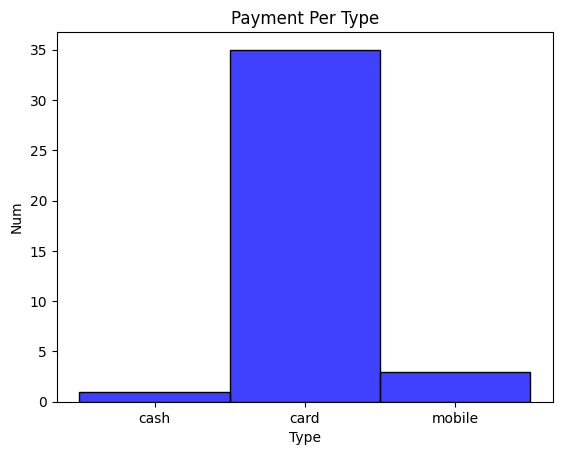

In [33]:
query = """
SELECT *
FROM trans_table;
"""

trans_data = pd.read_sql_query(query, conn)


sns.histplot(trans_data["trans_type"], bins=20, color="blue")
plt.title("Payment Per Type")
plt.xlabel("Type")
plt.ylabel("Num")


*We can see that the prefer payment type is card*

Text(0, 0.5, 'Num of Units')

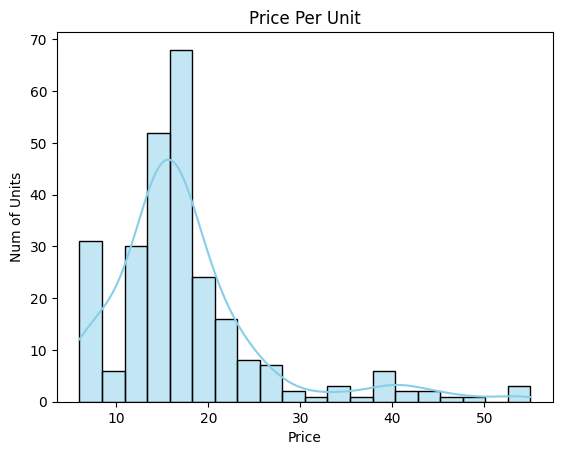

In [34]:
query = """
SELECT unit_price
FROM item_table;
"""

price_data = pd.read_sql_query(query, conn)


sns.histplot(price_data["unit_price"], bins=20, color="skyblue",kde=True,alpha=0.5)
plt.title("Price Per Unit")
plt.xlabel("Price")
plt.ylabel("Num of Units")

*We can see most of the product has price between 12 and 28*

Text(0, 0.5, 'Num of Transaction')

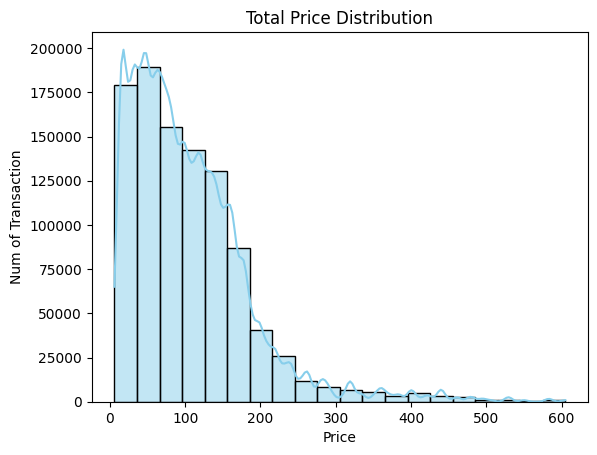

In [35]:
query = """
SELECT total_price
FROM fact_table;
"""

price_data_total = pd.read_sql_query(query, conn)


sns.histplot(price_data_total["total_price"], bins=20, color="skyblue", kde=True, alpha=0.5)
plt.title("Total Price Distribution")
plt.xlabel("Price")
plt.ylabel("Num of Transaction")

*Most transaction have a value between 5 and 100*

<ipython-input-36-62cf6f0f7c96>:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-36-62cf6f0f7c96>:31: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




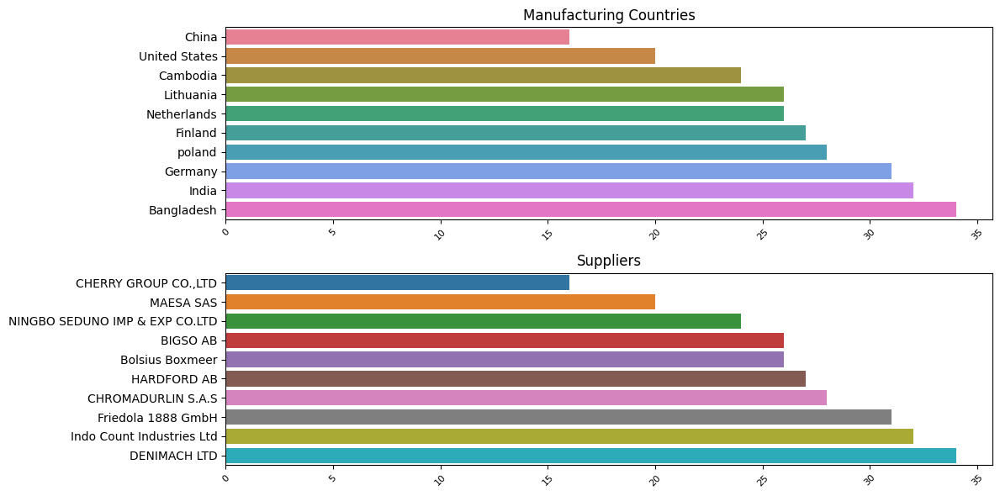

In [36]:
query_country = """
SELECT man_country, COUNT(*) AS frequency
FROM item_table
GROUP BY man_country
ORDER BY frequency;
"""

query_supplier = """
SELECT supplier, COUNT(*) AS frequency
FROM item_table
GROUP BY supplier
ORDER BY frequency;
"""

item_country = pd.read_sql_query(query_country, conn)
item_supplier = pd.read_sql_query(query_supplier, conn)


plt.figure(figsize=(12, 6))

# Histogram 1
plt.subplot(2, 1, 1)
sns.barplot(data=item_country, y="man_country", x="frequency", palette="husl")
plt.xticks(rotation=45, fontsize=8)
plt.title("Manufacturing Countries")
plt.xlabel("")
plt.ylabel("")

# Histogram 2
plt.subplot(2, 1, 2)
sns.barplot(data=item_supplier, y="supplier", x="frequency", palette="tab10")
plt.xticks(rotation=45, fontsize=8)
plt.title("Suppliers")
plt.xlabel("")
plt.ylabel("")

plt.tight_layout()
plt.show()

*We can see that Bangladesh is chosen the most for manufacturing and DENIMATCH LTD is the first supplier.*

**This section analyzes sales quantities by year and division, providing insights into sales patterns across various regions over time**

In [37]:
query = """
    SELECT
        t.date,
        t.year,
        s.division,
        SUM(f.quantity) AS total_sales_quantity
    FROM
        fact_table AS f
    INNER JOIN
        time_table AS t ON f.time_key = t.time_key
    INNER JOIN
        store_table AS s ON f.store_key = s.store_key
    GROUP BY
        t.year,
        s.division
"""
result_sales = pd.read_sql_query(query, conn)
result_sales.head()

,date,year,division,total_sales_quantity
0,13-04-2014 03:33,2014,BARISAL,58632
1,15-07-2014 02:58,2014,CHITTAGONG,153191
2,23-07-2014 22:00,2014,DHAKA,316194
3,24-02-2014 17:17,2014,KHULNA,87004
4,09-08-2014 15:01,2014,RAJSHAHI,93779


In [39]:
fig = px.bar(result_sales, x="year",
             y="total_sales_quantity",
             color="division",
             title="Total Quantity Sold by Year and Division",
             template="plotly_white",
             labels={"year": "Year", "total_sales": "Total Sales", "division":"Division"})
fig.show()

*We can state that the division with the highest sales over the years has been Dhaka, and just below is Chittagong*

**This section analyzes the trend of total sales over time and the trend of total sales over time for each division**

In [94]:
query = """
SELECT
    t.day,
    t.month,
    t.year,
    t.year || "-" || t.month || "-" || t.day AS date,
    SUM(f.total_price) AS total_sales
FROM
    fact_table AS f
INNER JOIN
    time_table AS t ON f.time_key = t.time_key
INNER JOIN
    store_table AS s ON f.store_key = s.store_key
GROUP BY
    t.year,
    t.month
ORDER BY
    t.year,
    t.month;
"""


sales_data = pd.read_sql_query(query, conn)
sales_data.head()

,day,month,year,date,total_sales
0,22,1,2014,2014-1-22,496549.25
1,24,2,2014,2014-2-24,1122547.00
2,26,3,2014,2014-3-26,1262435.75
3,30,4,2014,2014-4-30,1245142.50
4,14,5,2014,2014-5-14,1268770.50


In [88]:
fig = px.line(sales_data,
              x="date",
              y="total_sales",
              template="ggplot2",
              title="Total Sales Over Time",
              labels={"date": "Date", "total_sales": "Total Sales"})


fig.update_layout(xaxis_title="Date", yaxis_title="Total Sales")


fig.show()

In [42]:
query = """
SELECT
    t.day,
    t.year,
    t.month,
    s.division,
    t.year || "-" || t.month || "-" || t.day AS date,
    SUM(f.total_price) AS total_sales
FROM
    fact_table AS f
INNER JOIN
    time_table AS t ON f.time_key = t.time_key
INNER JOIN
    store_table AS s ON f.store_key = s.store_key
GROUP BY
    t.year,
    t.month,
    s.division
ORDER BY
    t.year,
    t.month;
"""


sales_data_division = pd.read_sql_query(query, conn)
sales_data_division.head()

,day,year,month,division,date,total_sales
0,29,2014,1,BARISAL,2014-1-29,35031.50
1,31,2014,1,CHITTAGONG,2014-1-31,94926.00
2,22,2014,1,DHAKA,2014-1-22,192214.25
3,28,2014,1,KHULNA,2014-1-28,54601.00
4,26,2014,1,RAJSHAHI,2014-1-26,55584.50


In [44]:
fig = px.line(sales_data_division,
              x="date",
              y="total_sales",
              color="division",
              template="plotly_white",
              title="Total Sales Over Time by Division",
              labels={"date": "Date", "total_sales": "Total Sales", "division": "Division"})


fig.update_layout(xaxis_title="Date", yaxis_title="Total Sales")


fig.show()

*this confirm our analysis from the sales pattern*

In [45]:
#let's check the outliers more closer that we can observe in our sales pattern

fig = px.violin(sales_data_division,
                x="division",
                y="total_sales",
                color="division",
                template="plotly_white",
                title="Distribution of Sales by Division",
                labels={"total_sales": "Total Sales", "division": "Division"})

fig.update_layout(yaxis_title="Total Sales")
fig.show()

*that's confirm the outliers that we can see before 2015 and after 2021. we can use where close to remove them as below:*

*WHERE (t.year > 2014 OR (t.year = 2014 AND t.month >= 2))AND (t.year < 2021 OR (t.year = 2020 AND t.month <= 12))*

In [46]:
query = """
SELECT
    t.month,
    SUM(f.total_price) AS total_sales
FROM
    fact_table AS f
INNER JOIN
    time_table AS t ON f.time_key = t.time_key
GROUP BY
    t.month
ORDER BY
    t.month;
"""


monthly_sales_data = pd.read_sql_query(query, conn)


fig_line = px.line(monthly_sales_data,
                   x="month",
                   y="total_sales",
                   title="Total Month Sales",
                   markers=True,
                   template="plotly_white",
                   labels={"month": "Month", "total_sales": "Total Sales"})

fig_line.show()

*with this graph we can confidently confirm that the sales drop in the 2 month february with the lowest total sales, followed by April and then June, while May is the month with the highest sales volume.*

In [47]:
query = """
SELECT
    t.day,
    SUM(f.total_price) AS total_sales
FROM
    fact_table AS f
INNER JOIN
    time_table AS t ON f.time_key = t.time_key
GROUP BY
    t.day
ORDER BY
    t.day;
"""


daily_sales_data = pd.read_sql_query(query, conn)


fig_line = px.line(daily_sales_data,
                   x="day",
                   y="total_sales",
                   title="Total Daily Sales",
                   template="plotly_white",
                   markers=True,
                   labels={"day": "Day", "total_sales": "Total Sales"})


fig_line.show()

*Daily sales are costant, we can only see a diminish in sales terms after the 30th day, but it's because some month have 31 days*

**Now let's see the Items selling performance**

In [48]:
query = """
SELECT
    i.item_name,
    f.unit,
    SUM(quantity) AS item_sold_total
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
GROUP BY
    i.item_name
ORDER BY
    item_sold_total DESC;
"""


item_quantity = pd.read_sql_query(query, conn)
item_quantity.head()

,item_name,unit,item_sold_total
0,Pepsi - 12 oz cans,cans,46837
1,Muscle Milk Protein Shake Van. 11oz,bottles,45665
2,Coke Classic 12 oz cans,cans,45501
3,Diet Coke - 12 oz cans,cans,45202
4,Sprite - 12 oz cans,cans,45140


In [49]:
fig = px.bar(item_quantity.head(20),
             x="item_sold_total",
             y="item_name",
             orientation="h",
             template="plotly_white",
             title="Top 20 Best Selling Items",
             labels={"item_name": "Item Name", "item_sold_total": "Total Quantity Sold"})

fig.update_layout(yaxis={"categoryorder":"total ascending"})


fig.show()

we can see tha beverages are the most selling items but let see that deeper to confirm that assumption.

In [50]:
query = """
SELECT
    i.desc AS item_description,
    f.unit,
    SUM(quantity) AS item_sold_total
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
GROUP BY
    item_description
ORDER BY
    item_sold_total DESC;
"""


item_category = pd.read_sql_query(query, conn)
item_category.head()

,item_description,unit,item_sold_total
0,a. Beverage - Soda,cans,659916
1,Food - Healthy,ct,655553
2,Food - Chips,bags,477884
3,a. Beverage Sparkling Water,cans,475022
4,Kitchen Supplies,rolls,435177


In [51]:
fig = px.bar(item_category.head(20),
             x="item_sold_total",
             y="item_description",
             orientation="h",
             template="plotly_white",
             title="Top 20 Selling Category",
             labels={"item_description": "Category", "item_sold_total": "Total Quantity Sold"})

fig.update_layout(yaxis={"categoryorder":"total ascending"})


fig.show()

*Let's breakdown for the soda beverage and the healthy food*

In [52]:
query = """
SELECT
    i.desc AS item_description,
    i.item_name,
    f.unit,
    SUM(quantity) AS item_sold_total
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
WHERE
    item_description LIKE "%Beverage%" AND item_description LIKE "%Soda%"
GROUP BY
    i.item_name
ORDER BY
    item_sold_total DESC;
"""


soda_item = pd.read_sql_query(query, conn)
soda_item.head()

,item_description,item_name,unit,item_sold_total
0,a. Beverage - Soda,Pepsi - 12 oz cans,cans,46837
1,a. Beverage - Soda,Coke Classic 12 oz cans,cans,45501
2,a. Beverage - Soda,Diet Coke - 12 oz cans,cans,45202
3,a. Beverage - Soda,Sprite - 12 oz cans,cans,45140
4,a. Beverage - Soda,Diet Pepsi - 12 oz cans,cans,23969


In [54]:
fig = px.bar(soda_item,
             x="item_sold_total",
             y="item_name",
             orientation="h",
             template="plotly_white",
             title="Top Selling Soda",
             labels={"item_name": "Soda", "item_sold_total": "Total Quantity Sold"})

fig.update_layout(yaxis={"categoryorder":"total ascending"})
fig.update_layout(height=800)


fig.show()

*We can see that classic Pepsi and Coca-Cola are the top-selling beverages, along with Sprite and Diet Cola. Diet Pepsi has sales that are nearly half of those of classic Pepsi*

In [55]:
query = """
SELECT
    i.desc AS item_description,
    i.item_name,
    f.unit,
    SUM(quantity) AS item_sold_total
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
WHERE
    item_description LIKE "%Food%" AND item_description LIKE "%Healthy%"
GROUP BY
    i.item_name
ORDER BY
    item_sold_total DESC;
"""


healhty_item = pd.read_sql_query(query, conn)
healhty_item.head()

,item_description,item_name,unit,item_sold_total
0,Food - Healthy,Nat.Valley PeanutButter Protein Bars,ct,23958
1,Food - Healthy,Quaker Instant Oatmeal Maple Brn Sugar,ct,23560
2,Food - Healthy,Belvita Hard Biscuits Cinnamon,ct.,23216
3,Food - Healthy,Detour Lower Sugar Protein Bar,bars,23190
4,Food - Healthy,Lunchables Variety Pack Oscar Meyer,ct.,22993


In [57]:
fig = px.bar(healhty_item,
             x="item_sold_total",
             y="item_name",
             orientation="h",
             template="plotly_white",
             title="Top Selling Healthy Food",
             labels={"item_name": "Healthy Food", "item_sold_total": "Total Quantity Sold"})

fig.update_layout(yaxis={"categoryorder":"total ascending"})
fig.update_layout(height=800)


fig.show()

*Regarding healthy foods, they all have similar sales volumes. We see a good number of protein bars and oatmeal*

**let's try to see the most expensive item.**

In [58]:
query = """
SELECT
    desc AS item_description,
    item_name,
    unit_price
FROM
    item_table
GROUP BY
    item_name,
    item_description
ORDER BY
    unit_price DESC;
"""


item_price_unit = pd.read_sql_query(query, conn)
item_price_unit.head()

,item_description,item_name,unit_price
0,Beverage - Energy/Protein,Red Bull 12oz,55.0
1,Coffee K-Cups,K Cups Daily Chef Columbian Supremo,53.0
2,Coffee K-Cups,K Cups Original Donut Shop Med. Roast,53.0
3,Coffee K-Cups,K Cups Dunkin Donuts Medium Roast,48.0
4,Coffee K-Cups,K Cups Folgers Lively Columbian,46.0


In [59]:
fig = px.bar(item_price_unit.head(20),
             x="unit_price",
             y="item_name",
             orientation="h",
             template="plotly_white",
             title="Top Expensive Items",
             labels={"item_name": "Item Name", "unit_price": "Unit Price"})

fig.update_layout(yaxis={"categoryorder":"total ascending"})
fig.update_layout(height=800)


fig.show()

# CUSTOMERS ANALYSIS

*we will categorize customers based on the number of purchases by calculating how many purchases each customer has above and below the average transaction cost*

In [60]:
query = """
SELECT
    f.payment_key,
    c.coustomer_key,
    c.name AS customer_name,
    t.trans_type,
    f.total_price,
    t.bank_name,
    CASE
        WHEN f.total_price > avg.total_avg THEN 'Above Average'
        WHEN f.total_price < avg.total_avg THEN 'Below Average'
        ELSE 'Equal to Average'
    END AS transaction_comparison
FROM
    fact_table AS f
INNER JOIN
    customer_table AS c ON f.coustomer_key = c.coustomer_key
INNER JOIN
    trans_table AS t ON f.payment_key = t.payment_key
INNER JOIN
    (
        SELECT
            payment_key,
            AVG(total_price) AS total_avg
        FROM
            fact_table
        GROUP BY
            payment_key
    ) AS avg
ON
    f.payment_key = avg.payment_key;
"""


avg_transaction = pd.read_sql_query(query, conn)
avg_transaction.head()

,payment_key,coustomer_key,customer_name,trans_type,total_price,bank_name,transaction_comparison
0,P026,C004510,priya,card,35.0,Premier Bank Limited,Below Average
1,P022,C008967,harpreet kaur,card,26.0,NRB Commercial Bank Ltd,Below Average
2,P030,C007261,sonam,card,100.0,Shimanto Bank Ltd,Below Average
3,P032,C007048,rekha bai,card,112.0,South Bangla Agriculture and Commerce Bank Lim...,Above Average
4,P014,C006430,mamta devi,card,64.0,Meghna Bank Limited,Below Average


In [61]:
fig_pie = px.pie(avg_transaction,
                 names='transaction_comparison',
                 title='Above and Below Average Transaction',
                 template="plotly_white")
fig_pie.show()

*Now, let's identify the top 10 customers with the most purchases above the average and the bottom 10 customers with the fewest purchases below the average*

In [69]:
above_avg_transactions = avg_transaction[avg_transaction['transaction_comparison'] == 'Above Average']
below_avg_transactions = avg_transaction[avg_transaction['transaction_comparison'] == 'Below Average']

above_avg_customer_transactions = above_avg_transactions.groupby('coustomer_key').size().reset_index(name='Above Avg Transaction Count')
below_avg_customer_transactions = below_avg_transactions.groupby('coustomer_key').size().reset_index(name='Below Avg Transaction Count')

top_10_customers_above_avg = above_avg_customer_transactions.sort_values(by='Above Avg Transaction Count', ascending=False).head(10)
top_10_customers_below_avg = below_avg_customer_transactions.sort_values(by='Below Avg Transaction Count', ascending=False).head(10)

# Above Average
fig_bar_top_10_customers_above_avg = px.bar(top_10_customers_above_avg,
                                            x='coustomer_key',
                                            y='Above Avg Transaction Count',
                                            template="plotly_dark",
                                            title='Top 10 Customers With Above Average Transactions',
                                            labels={'coustomer_key': 'Customer', 'Above Avg Transaction Count': 'Num of Transactions Above Average'})
fig_bar_top_10_customers_above_avg.show()

# Below Average
fig_bar_top_10_customers_below_avg = px.bar(top_10_customers_below_avg,
                                            x='coustomer_key',
                                            y='Below Avg Transaction Count',
                                            template="plotly_dark",
                                            title='Top 10 Customers With Below Average Transactions',
                                            labels={'coustomer_key': 'Customer', 'Below Avg Transaction Count': 'Num of Transactions Below Average'})
fig_bar_top_10_customers_below_avg.show()


*Let's see what are the most bought item and the most bought category from the top 10 customer with transaction above the average*

In [70]:
query = """
SELECT
    f.coustomer_key,
    f.item_key,
    i.item_name,
    i.desc,
    COUNT(f.item_key) AS item_count
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
WHERE
    f.coustomer_key IN ( 'C005908',
                         'C001197',
                         'C001677',
                         'C005316',
                         'C000273',
                         'C008532',
                         'C000364',
                         'C004349',
                         'C000758',
                         'C004323' )
GROUP BY
    i.item_name
ORDER BY
    item_count desc;
"""

top10_customer_item = pd.read_sql_query(query, conn)
top10_customer_item.head(5)

,coustomer_key,item_key,item_name,desc,item_count
0,C004349,I00027,Sprite - 12 oz cans,a. Beverage - Soda,18
1,C001197,I00059,Muscle Milk Protein Shake Van. 11oz,Beverage - Energy/Protein,12
2,C004349,I00095,Propel Zero Variety 20 oz,Beverage Water,11
3,C004349,I00024,Pepsi - 12 oz cans,a. Beverage - Soda,11
4,C005908,I00203,Nat.Valley PeanutButter Protein Bars,Food - Healthy,11


In [71]:
fig = px.bar(top10_customer_item.head(10),
             x="item_count",
             y="item_name",
             orientation="h",
             template="plotly_dark",
             title="Top Items Bought by Customer Above Average",
             labels={"item_name": "Item Name", "item_count": "Num of Items", "desc": "Category"},
             hover_name = "item_name",
             hover_data = ["desc"])

fig.update_layout(yaxis={"categoryorder":"total ascending"})

fig.update_layout(
    hoverlabel=dict(
        bgcolor="grey",
        font_size=16,
        font_family="Balto"
    )
)

fig.update_layout(height=800)


fig.show()

In [72]:
query = """
SELECT
    f.coustomer_key,
    f.item_key,
    i.item_name,
    i.desc,
    COUNT(i.desc) AS category_count
FROM
    fact_table AS f
INNER JOIN
    item_table AS i ON f.item_key = i.item_key
WHERE
    f.coustomer_key IN ( 'C005908',
                         'C001197',
                         'C001677',
                         'C005316',
                         'C000273',
                         'C008532',
                         'C000364',
                         'C004349',
                         'C000758',
                         'C004323' )
GROUP BY
    i.desc
ORDER BY
    category_count desc;
"""

top10_customer_category = pd.read_sql_query(query, conn)
top10_customer_category.head(5)

,coustomer_key,item_key,item_name,desc,category_count
0,C001197,I00209,Quaker Instant Oatmeal Maple Brn Sugar,Food - Healthy,139
1,C001677,I00011,Diet Coke Caffeine Free 12oz cans,a. Beverage - Soda,137
2,C004349,I00247,Cascade Gel w/ Dawn Dishwasher,Kitchen Supplies,107
3,C000273,I00033,La Croix Sparkling Grapefruit 12 oz,a. Beverage Sparkling Water,100
4,C005908,I00156,Flamin Hot Chip Mix 1oz,Food - Chips,97


In [73]:
fig = px.bar(top10_customer_category.head(10),
             x="category_count",
             y="desc",
             orientation="h",
             template="plotly_dark",
             title="Top Category Bought by Above Average Customer",
             labels={"desc": "Category", "category_count": "Num of Items", "desc": "Category"},
             hover_name = "desc",
             hover_data = ["desc"])

fig.update_layout(yaxis={"categoryorder":"total ascending"})

fig.update_layout(
    hoverlabel=dict(
        bgcolor="grey",
        font_size=16,
        font_family="Balto"
    )
)

fig.update_layout(height=800)


fig.show()

In [74]:
query = """

-- Evaluate the total number of purchase per upazila for every client

WITH customer_purchase_upazila AS (
    SELECT
        f.coustomer_key,
        s.upazila,
        s.district,
        COUNT (f.payment_key) AS purchase_count
    FROM
        fact_table AS f
    INNER JOIN
        store_table AS s ON f.store_key = s.store_key
    GROUP BY
        f.coustomer_key,
        s.upazila
    ORDER BY
        purchase_count DESC
),

-- Evaluate the total number of purchase per upazilla for every client

customer_purchase_total AS (
    SELECT
        f.coustomer_key,
        COUNT (f.payment_key) AS purchase_total
    FROM
        fact_table AS f
    GROUP BY
        f.coustomer_key
)


SELECT
    cpu.coustomer_key,
    cpu.upazila,
    cpu.district,
    cpu.purchase_count,
    cpt.purchase_total,
    (CAST(cpu.purchase_count AS FLOAT) / CAST(cpt.purchase_total AS FLOAT)) * 100 AS percentage_purchase -- Calculate the percentage based on the results of the two temp table
FROM
    customer_purchase_upazila AS cpu
INNER JOIN
    customer_purchase_total AS cpt ON cpu.coustomer_key = cpt.coustomer_key
WHERE
    cpu.purchase_count > 2
GROUP BY
    cpu.coustomer_key,
    cpu.upazila
ORDER BY
    percentage_purchase DESC
"""


percentage_customer_purchase = pd.read_sql_query(query, conn)
percentage_customer_purchase.head(5)

,coustomer_key,upazila,district,purchase_count,purchase_total,percentage_purchase
0,C005672,MIRPUR,DHAKA,6,104,5.769231
1,C004839,RAMPURA,DHAKA,6,106,5.660377
2,C006671,PAHARTALI,CHITTAGONG,6,107,5.607477
3,C005997,KADAMTALI,DHAKA,5,92,5.434783
4,C006892,MATIHAR,RAJSHAHI,5,92,5.434783


In [75]:
fig_bar = px.bar(
    percentage_customer_purchase.head(20),
    x='percentage_purchase',
    y='coustomer_key',
    orientation='h',
    template="plotly_dark",
    title='Percentage of purchases per upazila per each client',
    labels={'coustomer_key': 'Client', 'percentage_purchase': 'Acquisition Percentage (%)'}
)

fig_bar.show()

*We don't see any real customer loyalty towards the upazilas*

# Predictive Analysis

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



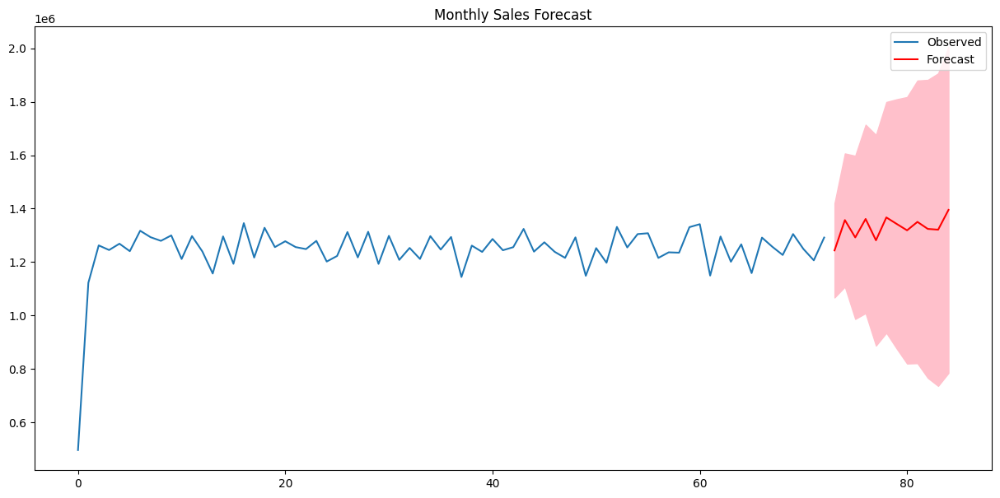

In [95]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

train_data = sales_data['total_sales'][:-12]  # Hold out the last 12 months for testing

sarima_model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))

sarima_result = sarima_model.fit()

# Make predictions for the next 12 months
predictions = sarima_result.get_forecast(steps=12)
predicted_means = predictions.predicted_mean
predicted_intervals = predictions.conf_int()

plt.figure(figsize=(15,7))
plt.plot(train_data.index, train_data, label='Observed')
plt.plot(predicted_means.index, predicted_means, color='r', label='Forecast')
plt.fill_between(predicted_intervals.index, predicted_intervals.iloc[:, 0], predicted_intervals.iloc[:, 1], color='pink')
plt.legend()
plt.title('Monthly Sales Forecast')
plt.show()

In [96]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

test_data = sales_data['total_sales'][-12:]

# Calculate MAE
mae = mean_absolute_error(test_data, predicted_means)
print(f'Mean Absolute Error (MAE): {mae}')

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_data, predicted_means))
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Calculate MAPE - Mean Absolute Percentage Error
mape = np.mean(np.abs((test_data - predicted_means) / test_data)) * 100
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

Mean Absolute Error (MAE): 114832.6581789088
Root Mean Squared Error (RMSE): 169069.1732870021
Mean Absolute Percentage Error (MAPE): 10.69577848123725%
